In [1]:
import os
from google.colab import files

HOME = os.getcwd()
print(HOME)

/content


In [2]:
!nvidia-smi

Tue Jun 10 16:52:12 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   41C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

#INSTALL DEPENDENCIES

In [3]:
!pip install tqdm --upgrade
!pip install ultralytics roboflow supervision flash-attn torch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 51.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 54.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 23.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 16.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 64.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 35.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 39.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.1 MB/s eta 0:00:00
   ━━━━━

In [4]:
from IPython.display import Image, display
import glob
import random
import yaml
import shutil
import cv2
import torch
import ultralytics
from tqdm.notebook import tqdm
from ultralytics import YOLO

ultralytics.checks()

Ultralytics 8.3.152 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 42.5/112.6 GB disk)


#IMPORTING DATASET FROM ROBOFLOW

In [6]:
from google.colab import userdata

In [7]:
from roboflow import Roboflow
rf = Roboflow(api_key=userdata.get('robo_api'))
project = rf.workspace("frysushiws").project("pothole_detection-yulbt")
version = project.version(1)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Pothole_detection-1 in yolov11:: 100%|██████████| 1028/1028 [00:00<00:00, 4179.71it/s]


In [8]:
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!echo -e "test: ../test/images\ntrain: ../train/images\nval: ../valid/images" >> {dataset.location}/data.yaml

#CUSTOM TRAINING

In [9]:
%cd {HOME}

!yolo task=detect mode=train model=yolo11s-seg.pt data={dataset.location}/data.yaml epochs=10 imgsz=640 plots=True

/content
100% 19.7M/19.7M [00:00<00:00, 129MB/s] 
WARNING ⚠️ conflicting 'task=detect' passed with 'task=segment' model. Ignoring 'task=detect' and updating to 'task=segment' to match model.
Ultralytics 8.3.152 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Pothole_detection-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s-seg.pt, 

#RESULT

In [10]:
!ls {HOME}/runs/segment/train3/

ls: cannot access '/content/runs/segment/train3/': No such file or directory


/content


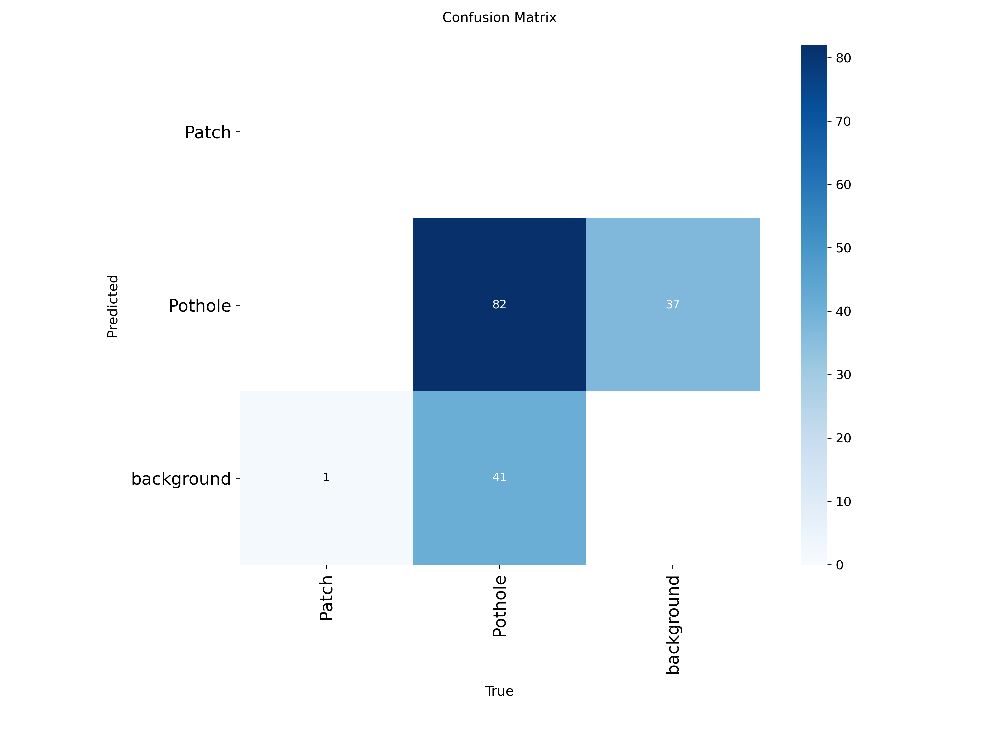

In [12]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train/confusion_matrix.png', width=600)

/content


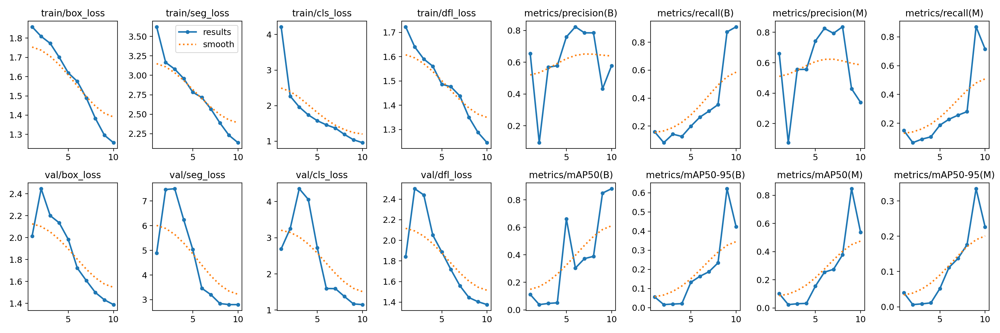

In [13]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train/results.png', width=600)

/content


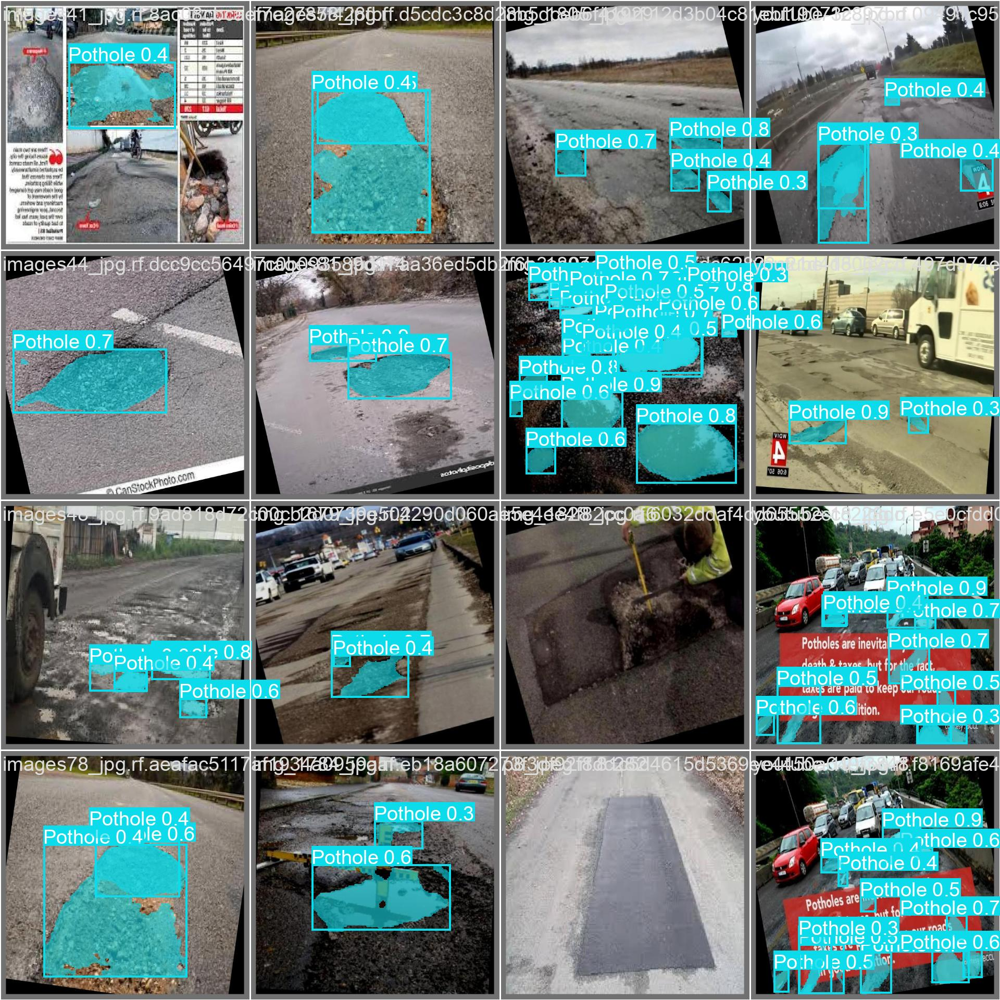

In [14]:
%cd {HOME}

Image(filename = f'{HOME}/runs/segment/train/val_batch0_pred.jpg', width = 600)

##TESTING WITH VIDEO

In [15]:
from google.colab import files
uploaded = files.upload()

Saving ssstik.io_@awanberdebu_1749573261975.mp4 to ssstik.io_@awanberdebu_1749573261975.mp4


In [16]:
uploaded_file_name = list(uploaded.keys())[0]
file_path = os.path.join(os.getcwd(), uploaded_file_name)

In [17]:
!pip install moviepy

from moviepy.editor import VideoFileClip

clip = VideoFileClip(uploaded_file_name)
clip_resized = clip.resize(width=640)
clip_resized.write_videofile("video_resized.mp4")

Moviepy - Building video video_resized.mp4.
MoviePy - Writing audio in video_resizedTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video video_resized.mp4



Moviepy - Done !
Moviepy - video ready video_resized.mp4


In [26]:
model = YOLO('/content/runs/segment/train/weights/best.pt')

In [27]:
results = model("video_resized.mp4", save=True, project='output', name='deteksi_video')


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/709) /content/video_resized.mp4: 640x384 (no detections), 15.5ms
video 1/1 (frame 2/709) /content/video_resized.mp4: 640x384 (no detections), 13.9ms
video 1/1 (frame 3/709) /content/video_resized.mp4: 640x384 (no detections), 14.0ms
video 1/1 (frame 4/709) /content/video_resized.mp4: 640x384 (no detections), 14.0ms
video 1/1 (frame 5/709) /content/video_resized.mp4: 640x384 (no detections), 13.9ms
video 1/1 (frame 6/709) /content/vid

In [31]:
!apt install ffmpeg
!ffmpeg -i output/deteksi_video2/video_resized.avi -vcodec libx264 output/deteksi_video2/video_resized.mp4

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.
ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq -

In [33]:
from IPython.display import Video

Video("output/deteksi_video2/video_resized.mp4", embed=True)

#DEPLOY TO ROBOFLOW

In [47]:
rf = Roboflow(userdata.get('robo_api'))
workspace = rf.workspace("frysushiws")

workspace.deploy_model(
  model_type="yolov11",
  model_path="./runs/segment/train/",
  project_ids=["pothole_detection-yulbt"],
  model_name="pothole-segmentation-yolov11-v2"
)

loading Roboflow workspace...
View the status of your deployment for project pothole_detection-yulbt at: https://app.roboflow.com/frysushiws/pothole_detection-yulbt/models


#FINISH!

Reference:

---


Linas Kondrackis. (Oct 3, 2024). How to Train YOLOv11 Instance Segmentation on a Custom Dataset. Roboflow Blog: https://blog.roboflow.com/train-yolov11-instance-segmentation/